# Mid-gestation fetal cortex dataset: Cluster characterization

_**Single cell transcriptomics dataset from paper published by Trevino et al. (Cell 2021) characterizing human fetal cortex at mid-gestation**._

__Upstream Steps__

* Assemble adata
* QC filter on cells
* Expression filter on genes
* Normalization and log10 transformation by Scanpy functions
* Feature selection (HVG) by Scanpy functions
* Dimensionality reduction
* Batch correction by Harmony
* Cluster identification

__This notebook__

* Cluster characterization


----

# 1. Environment Set Up

## 1.1 Library upload

In [1]:
import os
import sys

import numpy as np
import pandas as pd
import igraph as ig
import scanpy as sc
import scanpy.external as sce
from scipy.sparse import csr_matrix, isspmatrix
import gseapy as gp

#Plotting
import matplotlib.pyplot as plt
import seaborn as sns

#ultils
#import ipynbname
from datetime import datetime

In [2]:
# Custom functions
sys.path.append('HelperFunctions')
import Day1Helper as fn

In [3]:
sc.settings.verbosity = 3
sc.settings.set_figure_params(dpi=80, fontsize=12)

## 1.2 Start Computation time

In [4]:
print(datetime.now())

2024-11-10 10:56:32.410390


----

# 2. Read input files  

In [5]:
path = '../DataDir/InputData/'
Id = 'Day1_2_TrevinoFiltNormAdata.h5ad'

input_file = path + Id

adata = sc.read(input_file)

In [6]:
print('Loaded Normalizes AnnData object: number of cells', adata.n_obs)
print('Loaded Normalizes AnnData object: number of genes', adata.n_vars)

print('Available metadata for each cell: ', adata.obs.columns)

Loaded Normalizes AnnData object: number of cells 45888
Loaded Normalizes AnnData object: number of genes 16324
Available metadata for each cell:  Index(['Auth_Sample.ID', 'Auth_Age', 'Auth_Tissue.ID', 'Auth_Sample.Type',
       'Auth_Assay', 'Auth_Batch', 'Auth_seurat_clusters', 'Auth_RNA.Counts',
       'Auth_RNA.Features', 'Auth_Percent.MT', 'Auth_Percent.Ribo',
       'Auth_Cell.Barcode', 'Auth_DF_pANN', 'Auth_DF_classification',
       'Auth_DF_pANN_quantile', 'Auth_Spliced.Counts', 'Auth_Spliced.Features',
       'Auth_Unspliced.Counts', 'Auth_Unspliced.Features',
       'Auth_Ambiguous.Counts', 'Auth_Ambiguous.Features', 'dataset_id',
       'sample_id', 'brain_region', 'age', 'stage', 'batch_key', 'cell_label',
       'cell_class', 'n_genes_by_counts', 'log1p_n_genes_by_counts',
       'total_counts', 'log1p_total_counts', 'total_counts_mito',
       'log1p_total_counts_mito', 'pct_counts_mito', 'total_counts_ribo',
       'log1p_total_counts_ribo', 'pct_counts_ribo', 'gene_UMI

# 3. Cluster characteristics

## 3.1 Check with original annotation

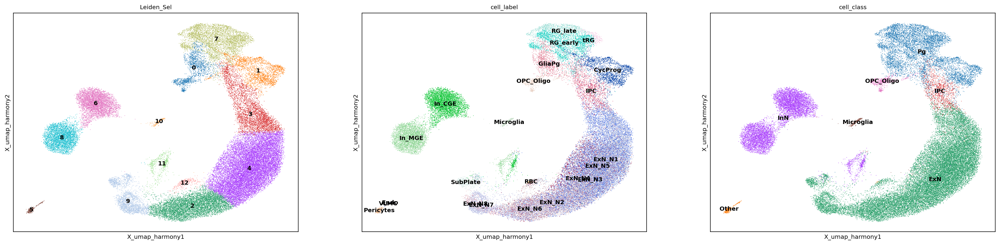

In [7]:
sc.settings.set_figure_params(fontsize=9, figsize=[8, 6])

sc.pl.embedding(adata, basis="X_umap_harmony", color=['Leiden_Sel','cell_label', 'cell_class'],
                legend_loc='on data')

In [8]:
pd.crosstab(adata.obs['cell_class'], adata.obs['Leiden_Sel'], normalize = 'columns', margins=True)

Leiden_Sel,0,1,2,3,4,5,6,7,8,9,10,11,12,All
cell_class,,,,,,,,,,,,,,
Pg,0.647059,0.914141,0.000904,0.124337,0.001495,0.0,0.000231,0.988905,0.000574,0.003520,0.0,0.005505,0.009967,0.168214
Other,0.000000,0.000459,0.000452,0.000530,0.001121,1.0,0.000692,0.000236,0.000287,0.000880,0.0,0.000000,0.039867,0.006450
ExN,0.000000,0.000000,0.995633,0.615589,0.992713,0.0,0.000462,0.000708,0.001147,0.978443,0.0,0.110092,0.946844,0.598196
IPC,0.001898,0.061983,0.000753,0.256098,0.000374,0.0,0.000923,0.009443,0.000287,0.000000,0.0,0.009174,0.000000,0.025388
InN,0.000000,0.000000,0.000301,0.001326,0.001246,0.0,0.994923,0.000000,0.995985,0.016278,0.0,0.875229,0.003322,0.181442
Microglia,0.000000,0.000459,0.001657,0.001856,0.002803,0.0,0.002539,0.000472,0.001721,0.000880,1.0,0.000000,0.000000,0.006930
OPC_Oligo,0.351044,0.022957,0.000301,0.000265,0.000249,0.0,0.000231,0.000236,0.000000,0.000000,0.0,0.000000,0.000000,0.013380


> `_Try yourself_:` 
> `what if you want to see total number of cells instead of %?`

In [9]:
# write your code here

> `_Try yourself_:` 
> `what if you want to compare with the more granular annotation?`

In [10]:
# write your code here

#### Comparison outcome
From the comparison above, we can hypothesize a first large-grain definition of our clusters.

* __Excitatory Neurons__: C2, C3 (IPC), C4, C9
* __Inhibitory Neurons__: C6, C8, C11
* __Progenitors__: C1, C7
* __Glia__: C0 (progenitors, OPC), C10 (microglia)
* __Other__: C5

## 3.2 Cluster dendrogram

    using 'X_pca' with n_pcs = 5
Storing dendrogram info using `.uns['dendrogram_Leiden_Sel']`


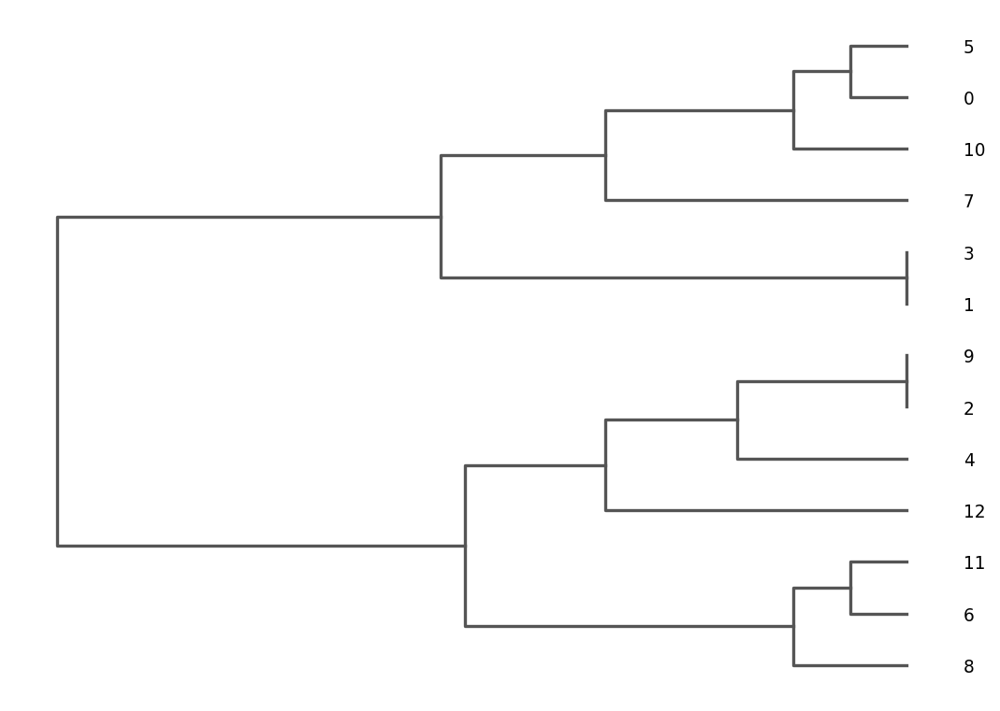

<Axes: >

In [11]:
sc.settings.set_figure_params(fontsize=10, figsize=[8, 6])

sc.tl.dendrogram(adata, groupby='Leiden_Sel', n_pcs=5, cor_method='spearman', linkage_method='average')
sc.pl.dendrogram(adata, groupby='Leiden_Sel', orientation='left')

> `_Try yourself_:` 
> `How to compare to a dendrogram created on the annotation from the original paper?`

In [12]:
# write your code here

----

# 4. Population markers

* Supervised approach: plot on the UMAP your own set of population markers
* The definition of the markers strongly depends on biological knowledge and liteature survey, and it is context-dependent
* As an example, we define below a dictionary of markers usually checked in cortex datasets (not comprehensive!!)
* We use the __customUmap__ function defined in the helper file: check there to go back to the basic scanpy function, for the fine-tuning of the parameters or to create your own custom function


In [13]:
marker_dictionary = {

    'Proliferating_Progenitors': ['MKI67', 'CDC20', 'HMGB2', 'CCNB1', 'CCNB2', 'ASPM'], 
    'Radial_Glia': ['SOX2', 'PAX6', 'NES', 'VIM', 'HES1', 'GLI3'],
    'Intermediate_Progenitors': ['EOMES', 'ELAVL4', 'NHLH1', 'KCNQ3', 'INSM1', 'HES6'], 
    'oRG': ['FAM107A', 'HOPX',  'PTPRZ1', 'TNC', 'ITGB5'], 
    
    'Neurons': ['GAP43', 'DCX', 'STMN2', 'MAP2', 'SYT1', 'MEF2C'], 
    
    'Excitatory_Progenitors': ['EMX1', 'NEUROD1', 'NEUROD2', 'NEUROD6', 'NEUROG2', 'NEUROG1'],
    'Excitatory_Neurons': ['SLC17A6', 'SLC17A7', 'GRIN2A', 'GRIN2B', 'SLA'], 
    
    'Inhibitory_Early': ['NKX2-1', 'DLX5', 'DLX6', 'DLX1', 'DLX2', 'DLX6-AS1'],
    'Inhibitory_Neurons': ['GAD1', 'GAD2', 'SLC32A1', 'CALB1', 'CALB2', 'NPY', 'SST', 'PVALB', 'VIP'],
    
    'Astrocytes': ['GFAP', 'SLC1A3',  'S100B', 'AQP4', 'ALDH1L1', 'TNC'], 
    'Microglia': ['PTPRC', 'AIF1', 'CCL3', 'ITGAM', 'CX3CR1', 'CD74'], 
    
    'Endothelial_Pericytes': ['CLDN5', 'PECAM1', 'ABCG2', 'FOXC2', 'PDGFRB', 'IFITM2'], 
    }

PROLIFERATING_PROGENITORS:

The following marker genes are missing:  set()


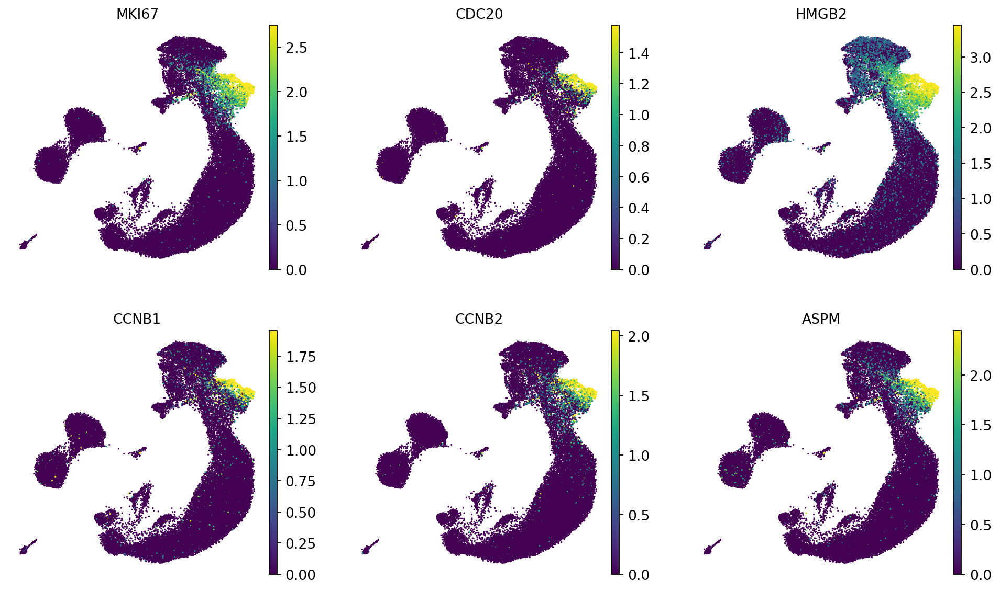





RADIAL_GLIA:

The following marker genes are missing:  set()


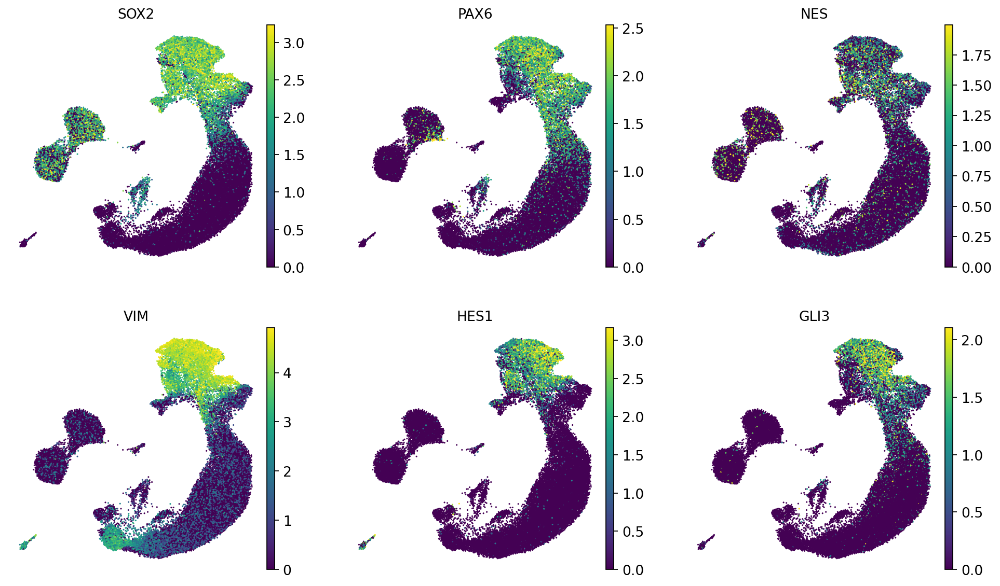





INTERMEDIATE_PROGENITORS:

The following marker genes are missing:  set()


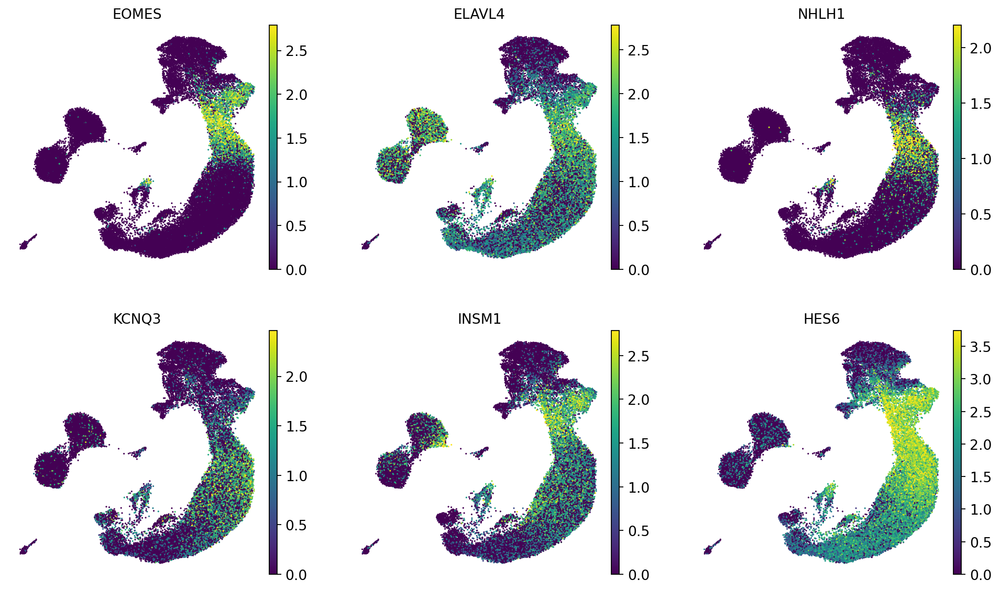





ORG:

The following marker genes are missing:  set()


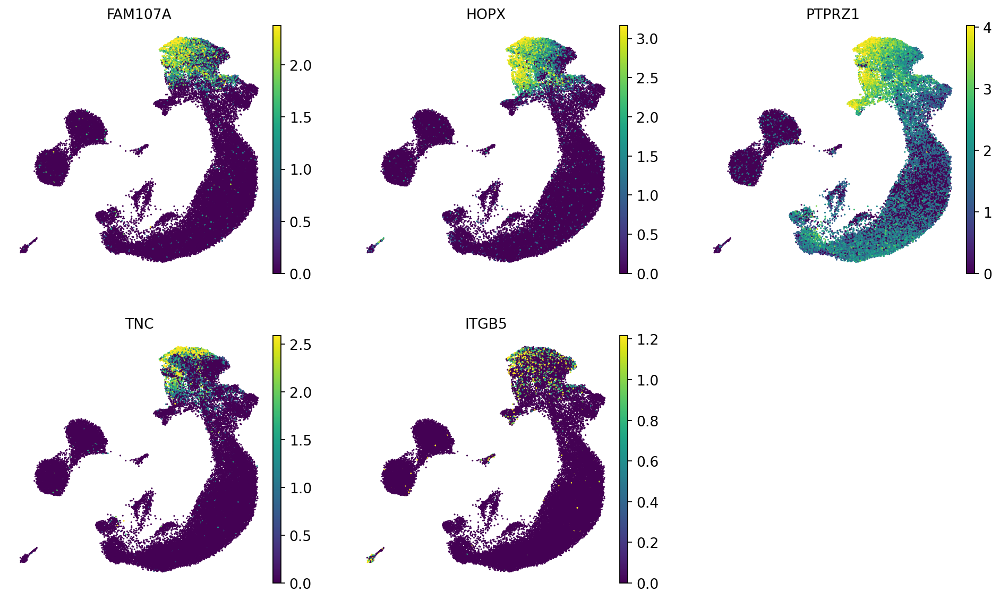





NEURONS:

The following marker genes are missing:  set()


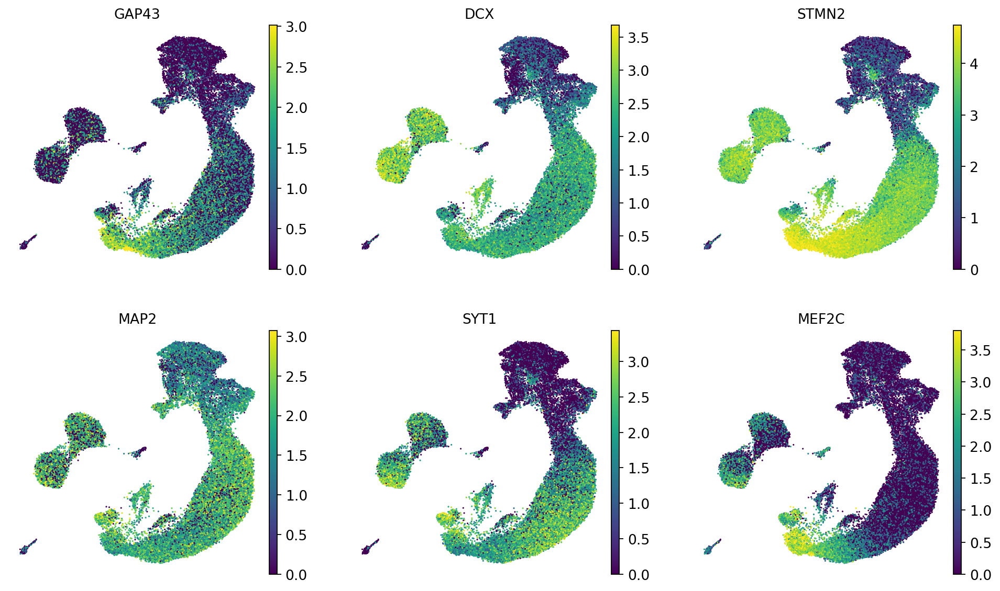





EXCITATORY_PROGENITORS:

The following marker genes are missing:  set()


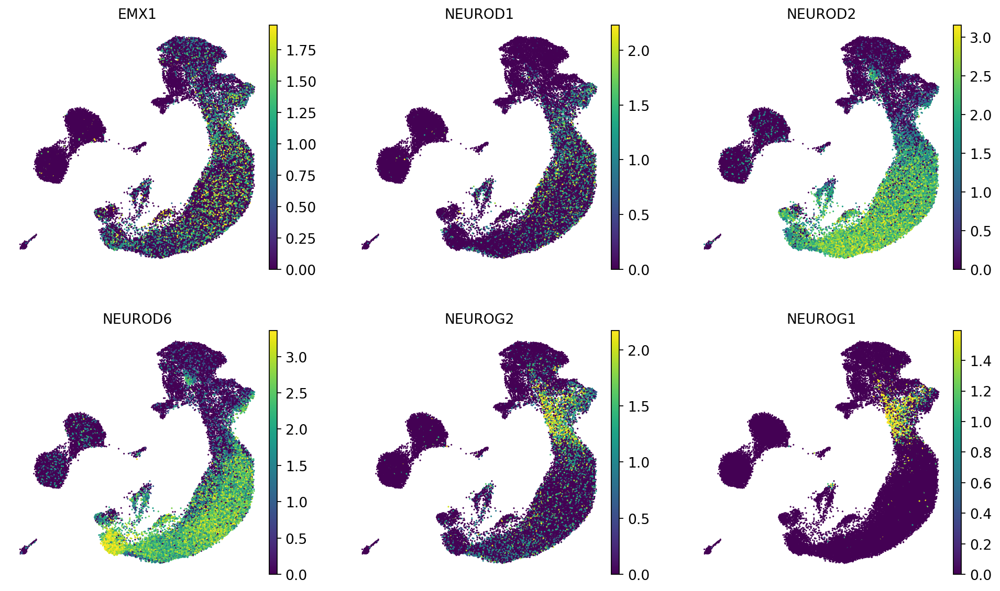





EXCITATORY_NEURONS:

The following marker genes are missing:  set()


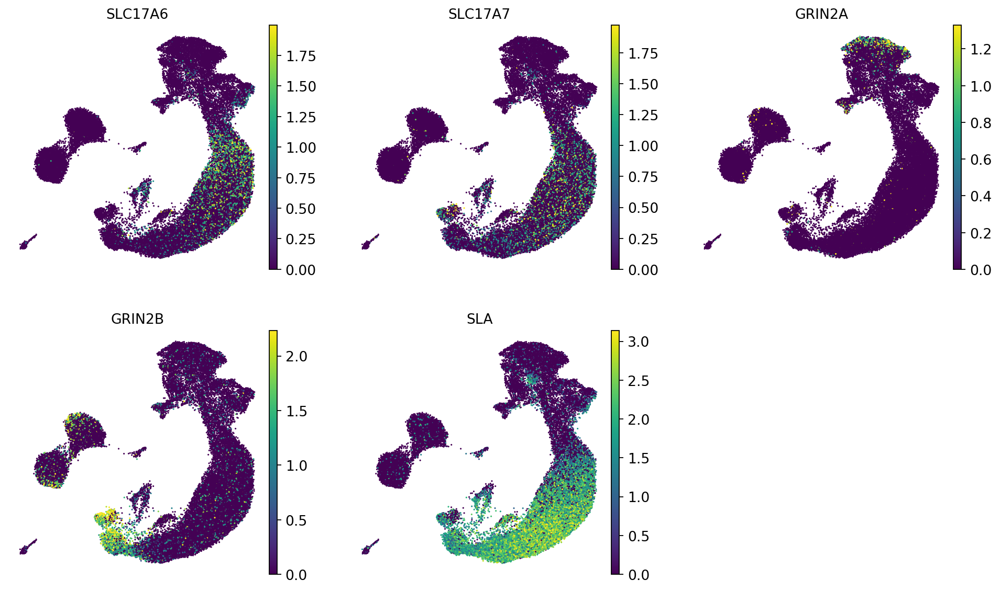





INHIBITORY_EARLY:

The following marker genes are missing:  set()


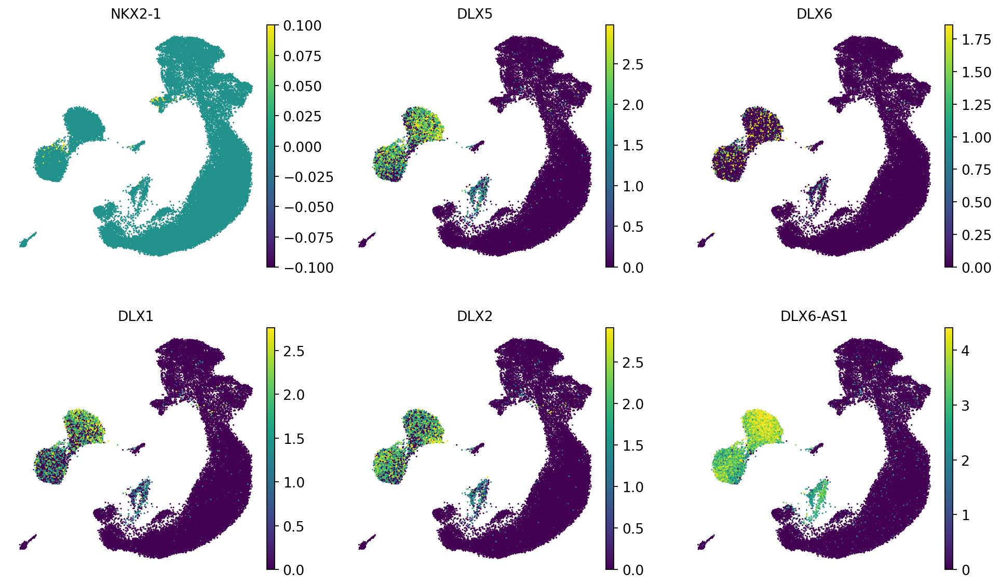





INHIBITORY_NEURONS:

The following marker genes are missing:  {'PVALB'}


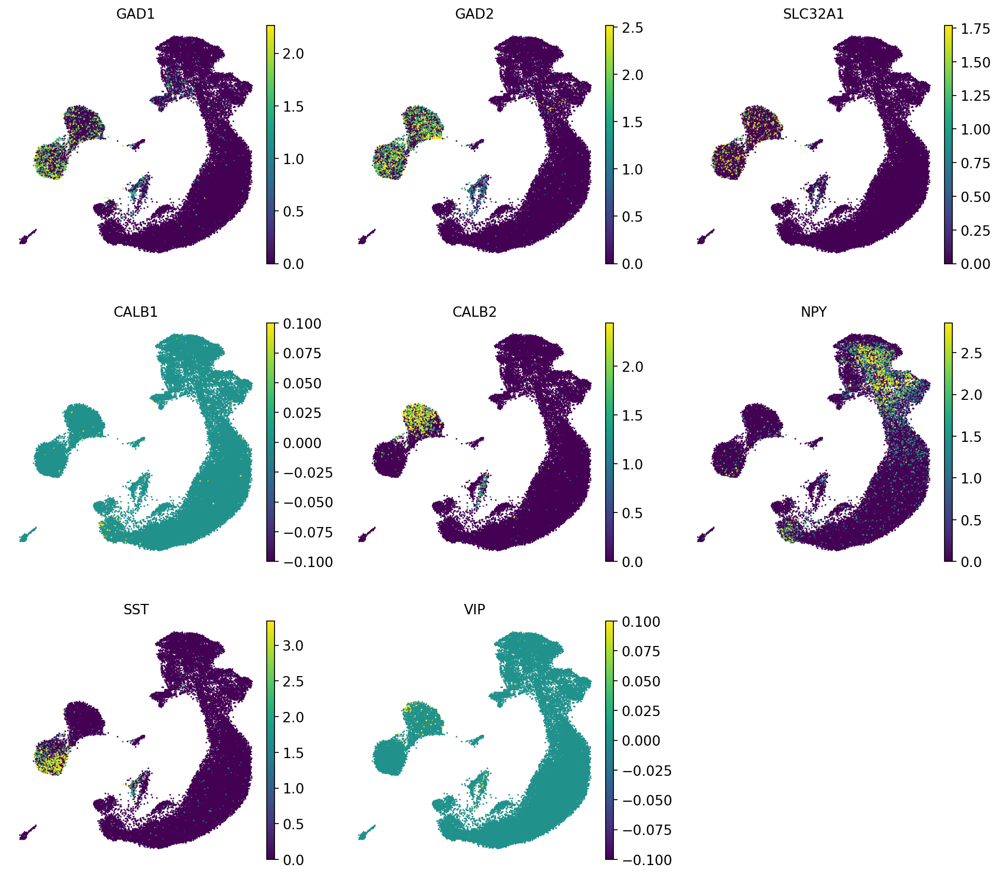





ASTROCYTES:

The following marker genes are missing:  set()


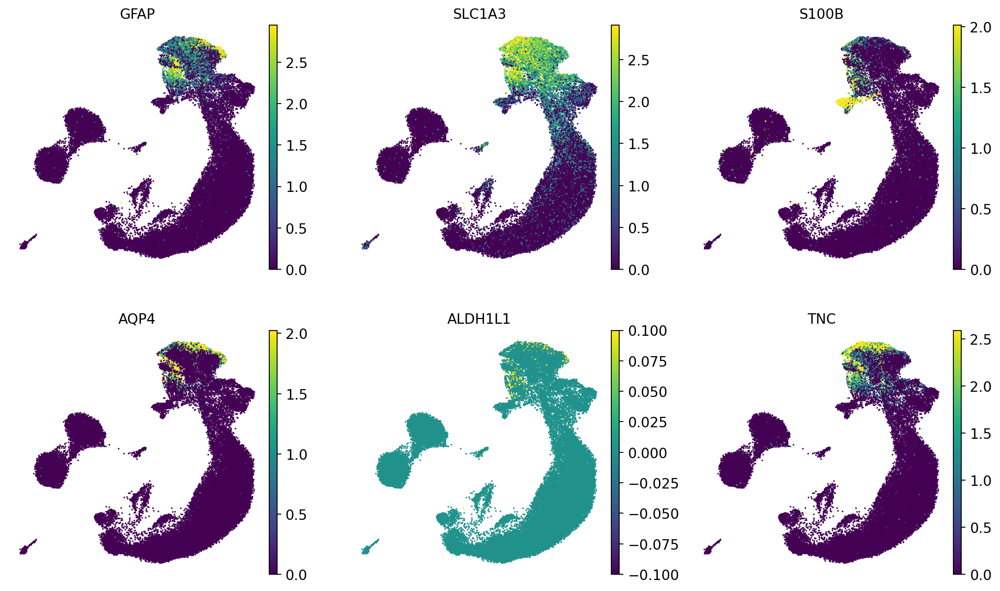





MICROGLIA:

The following marker genes are missing:  {'ITGAM'}


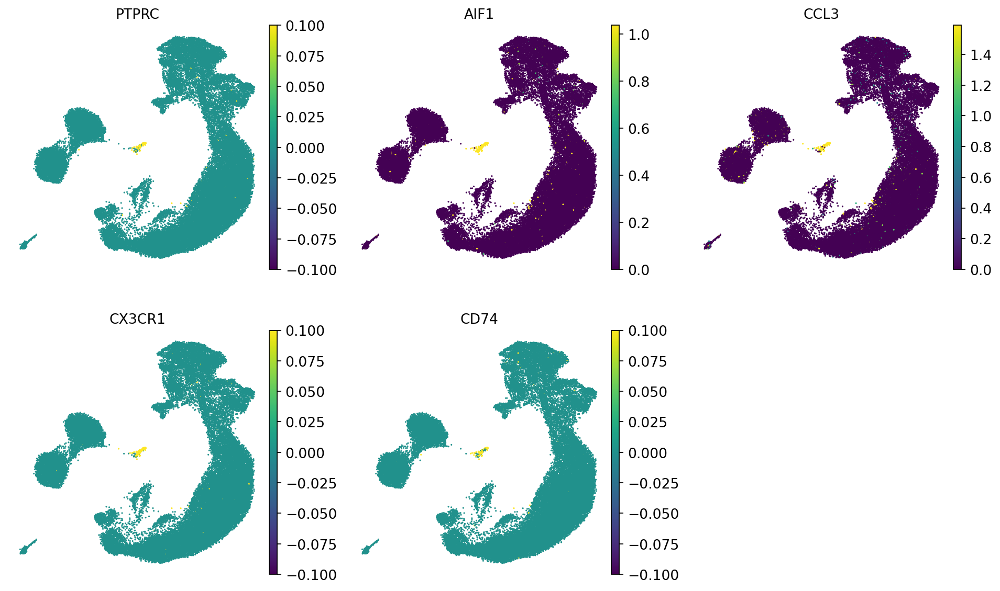





ENDOTHELIAL_PERICYTES:

The following marker genes are missing:  set()


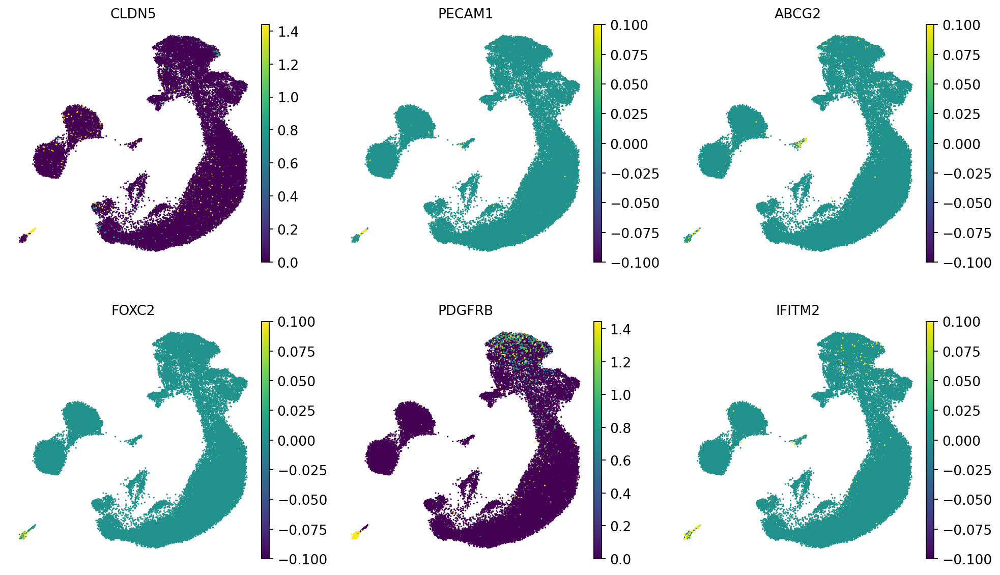

In [14]:
sc.settings.set_figure_params(dpi=80, fontsize=12)

for population in marker_dictionary: 
    print(f"{population.upper()}:")
    fn.customUmap(adata, marker_dictionary[population], size=8)
    print("\n\n\n")

> `_Try yourself_:` 
> `define below a small dictionary of genes you are interested in and plot them on the UMAP`

In [15]:
# write your code here

------

# 5. Cluster Top Markers

## 5.1 Identify Cluster top-markers

For each cluster, top-marker genes are identified by comparing the expression in that cluster versus all the others. Scanpy [tl.rank_genes_groups](https://scanpy.readthedocs.io/en/stable/generated/scanpy.tl.rank_genes_groups.html) function is used to this purpose.
* groupby: cluster labels
* method: statistical method for differential expression analysis. Here we specify Wilcoxon test (non-parametric). 

In [16]:
adata.uns['log1p']['base'] = None
sc.tl.rank_genes_groups(adata, groupby='Leiden_Sel', method='wilcoxon', key_added='wilcox', 
                       use_raw=False, pts=True)

ranking genes
    finished: added to `.uns['wilcox']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:01:02)


In [17]:
GroupMarkers = pd.DataFrame(adata.uns['wilcox']['names']).head(101)
GroupMarkers.columns = 'Cl_' + GroupMarkers.columns

GroupMarkers.head(11)

,Cl_0,Cl_1,Cl_2,Cl_3,Cl_4,Cl_5,Cl_6,Cl_7,Cl_8,Cl_9,Cl_10,Cl_11,Cl_12
0,BCAN,HMGB2,SATB2,HES6,ENC1,IGFBP7,DLX6-AS1,VIM,ERBB4,MEF2C,FTL,DLX6-AS1,TMSB10
1,DBI,TOP2A,STMN2,TMEM158,GRIA2,IFITM3,BTG1,TTYH1,MAF,NELL2,SPP1,ERBB4,RPL10
2,OLIG1,HMGB1,LIMCH1,EOMES,POU3F2,GNG11,CCDC88A,PTN,DLX6-AS1,GRIN2B,AIF1,DLX5,STMN2
3,PTPRZ1,TUBA1B,GPM6A,PRDX1,MLLT3,SPARC,DLX5,FABP5,PDE4DIP,ARPP21,TYROBP,DCX,STMN1
4,OLIG2,HMGN2,SLA,PPP1R17,MEIS2,FN1,DLX1,SLC1A3,ARX,CALM1,B2M,DLX2,TUBB2B
5,CSPG5,H2AZ1,NEUROD2,SSTR2,CPE,B2M,ERBB4,ID4,DLX2,MAP1B,RGS10,ARX,RPL13
6,METRN,CENPF,SYT4,CCND2,NFIB,MYL12A,DLX2,CLU,DCX,CHL1,ITM2B,PDE4DIP,RPL26
7,PDGFRA,NUSAP1,ADRA2A,MIR99AHG,NEUROD2,ARHGAP29,TCF4,GPM6B,CXCR4,CELF2,S100A11,DLX1,TUBA1A
8,QKI,MKI67,BCL11A,NFIA,ROBO2,COL4A1,NR2F2,SFRP1,C11orf96,GAP43,SAT1,PLS3,TUBB
9,GPM6B,SMC4,TUBA1A,EEF1D,NTM,COL4A2,MEG3,ZFP36L1,PLS3,SLITRK5,CTSB,CCDC88A,PTMA


## 5.2 Visualize marker genes

### DotPlot

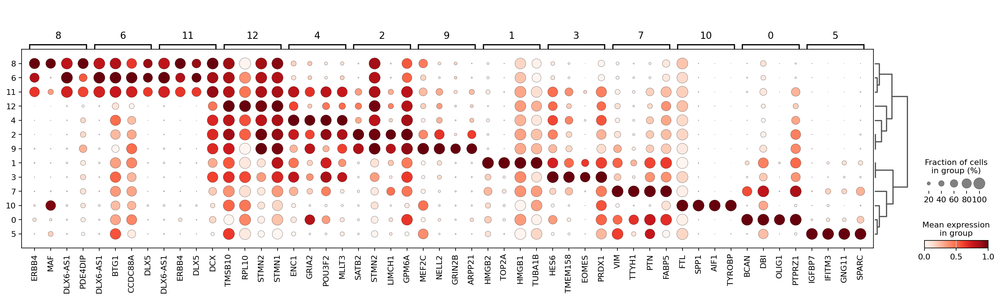

In [18]:
sc.pl.rank_genes_groups_dotplot(adata, n_genes=4, key='wilcox', standard_scale="var")  
# standard scale: normalize each gene to range from 0 to 1

## 5.3 Filter top marker genes

* To improve the specificity of the markers, we can filter top-markers genes, e.g. considering ther % of expression in the target population and in the other cells.
* We can then plot again the results with dotplot or matrixplot

In [19]:
sc.tl.filter_rank_genes_groups(
    adata,
    min_in_group_fraction=0.3,
    max_out_group_fraction=0.2,
    key="wilcox", key_added="wilcox_filt",
)

Filtering genes using: min_in_group_fraction: 0.3 min_fold_change: 1, max_out_group_fraction: 0.2


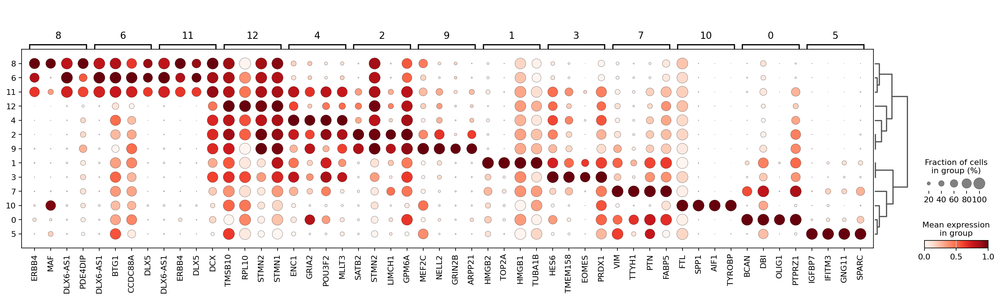

In [20]:
sc.pl.rank_genes_groups_dotplot(adata, n_genes=4, key='wilcox', 
                               standard_scale="var") 

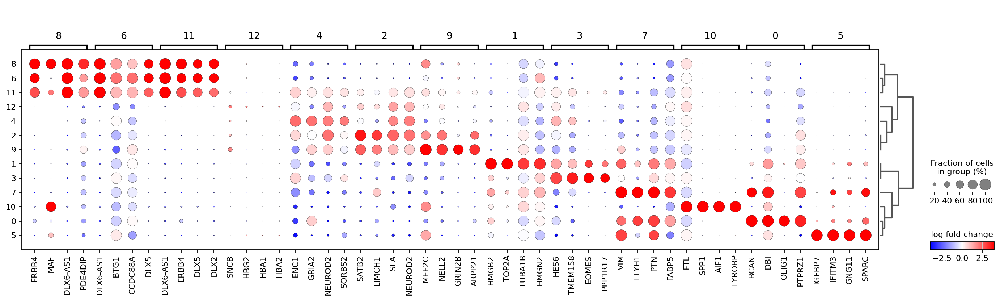

In [21]:
sc.pl.rank_genes_groups_dotplot(
    adata, key='wilcox', n_genes=4,
    values_to_plot="logfoldchanges",
    cmap='bwr', vmin=-4, vmax=4, min_logfoldchange=2,
    colorbar_title='log fold change',
)

categories: 0, 1, 2, etc.
var_group_labels: 0, 1, 2, etc.


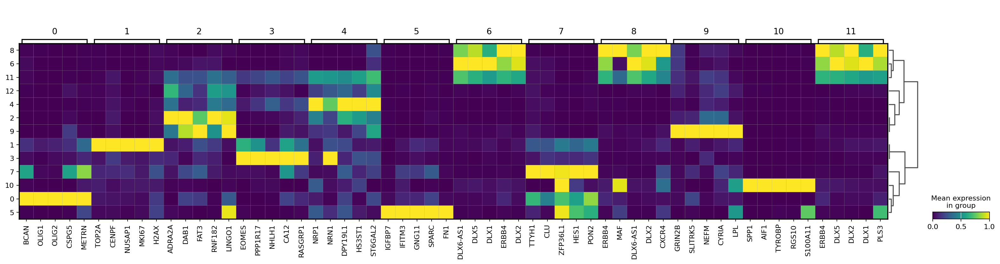

In [22]:
sc.pl.rank_genes_groups_matrixplot(adata, n_genes=5, key='wilcox_filt', standard_scale="var")

## 5.4 Marker overlap

* To gain further information on our clusters, we can overlap the top-genes of each cluster with external gene sets (e.g. reliable sets of population marker genes; genes identified by other studies, etc.).
* As an example, here we overlap the marker dictionary defined above

In [23]:
marker_overlap = sc.tl.marker_gene_overlap(adata, marker_dictionary, key='wilcox', 
                         top_n_markers=100, method='jaccard')

marker_overlap.columns = marker_overlap.columns.astype('category')

<Axes: >

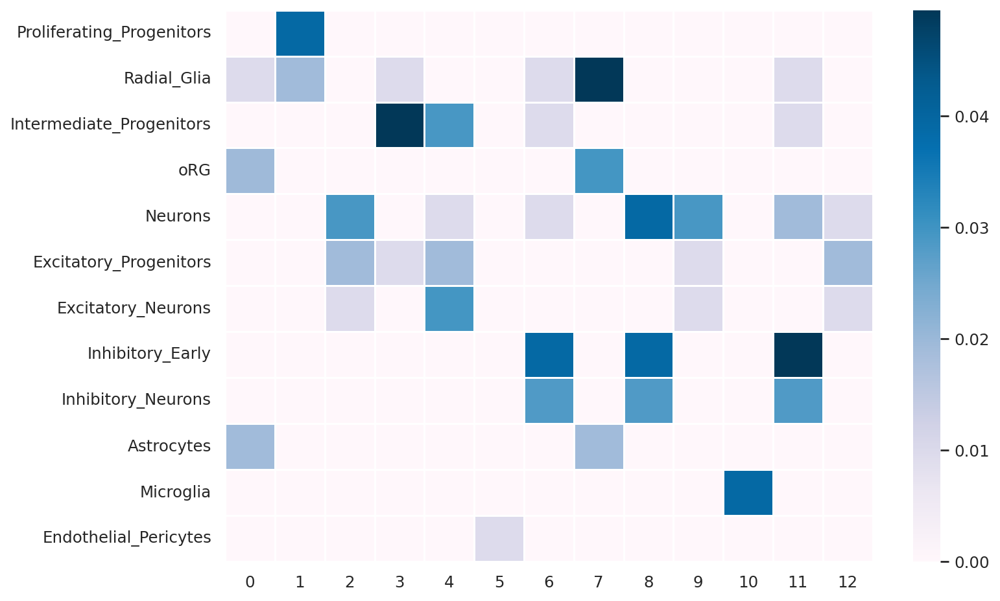

In [24]:
sns.set_theme()
f, ax = plt.subplots(figsize=(10, 7))
sns.heatmap(marker_overlap, linewidths=.5, ax=ax, cmap = 'PuBu')

----

# 6. Functional analysis by gseapy

## 6.1 Approaches

### Overview
Two main approaches can be employed

* __over-representation analysis__: test for enrichment of functionally relevant gene sets in the pool of the gene of interest (e.g. genes selected as cluster markers, DEGs) compared to the gene universe (all expressed/tested genes).  
* __gsea-like approaches__: rank all tested genes according to statistical metrics (e.g. PValue, Fold-Change, etc.) and test the distribution of the gene sets along the list (e.g. more present in the top-part of the list vs evenly distributed).  

Each of these methods has advantages and drawbacks. In general, take into consideration that functional enrichment analyses are just a way to try to describe from a functional point of view your list of genes; they rely on vocabularies that can be variably complete and tuned to your biological system.
Considering this, it is wiser to use the results as complementary to evidence coming from other approaches, rather than blindly and acritically rely on them.

### Gseapy

* [Read the docs](https://gseapy.readthedocs.io/en/latest/index.html)
* [Bioinformatics Paper](https://academic.oup.com/bioinformatics/article/39/1/btac757/6847088)
* [GitHub repo](https://github.com/zqfang/GSEApy)

### Other tools

* [GProfiler](https://pypi.org/project/gprofiler-official/)
* [Decoupler](https://decoupler-py.readthedocs.io/en/latest/)
* [TopGO](https://bioconductor.org/packages/devel/bioc/vignettes/topGO/inst/doc/topGO.pdf)

In [25]:
# to check available gene sets
gp.get_library_name()[:5]

['ARCHS4_Cell-lines',
 'ARCHS4_IDG_Coexp',
 'ARCHS4_Kinases_Coexp',
 'ARCHS4_TFs_Coexp',
 'ARCHS4_Tissues']

## 6.2 Pre-ranked GSEA

* the custom function __customGseapy__ (see helper file) first generates the list of marker genes ranked according to scanpy-calculated score for the cluster of interest
* GSEA is then applied to the pre-ranked list for the gene sets of interests
* as an example, here we test two genes sets (GO Biological Process; Cell Markers collection) on a subset of clusters.

In [26]:
# C1: progenitors - C8: inhibitory neurons - C9: excitatory neurons - C10: microglia 

Cl = ['1', '8' , '9', '10']

for i in Cl: 
    print("\n\n {}".format(i)) 
    display(fn.customGseapy(adata, cluster=i, rank='wilcox', 
                            sets = ['GO_Biological_Process_2023'],
                            fdr_th=0.005, nes_th=1.75, show=5))

2024-11-10 10:58:12,245 [WARNING] Duplicated values found in preranked stats: 0.10% of genes
The order of those genes will be arbitrary, which may produce unexpected results.




 1


,nes,pval,fdr,fwerp,tag %,gene %,lead_genes
GO_Biological_Process_2023__Positive Regulation Of Cell Cycle Process (GO:0090068),1.908707,0.0,0.0,0.0,53/95,7.06%,NUSAP1;SMC4;MAD2L1;BIRC5;SMC2;NDC80;NCAPG;ECT2...
GO_Biological_Process_2023__Mitotic Spindle Organization (GO:0007052),1.876042,0.0,0.0,0.0,40/82,6.28%,TPX2;BIRC5;NUF2;KIF11;NDC80;CENPE;RAN;SPC25;DL...
GO_Biological_Process_2023__Mitotic Sister Chromatid Segregation (GO:0000070),1.865853,0.0,0.0,0.0,54/107,6.73%,NUSAP1;SMC4;TPX2;SMC2;KIF11;ZWINT;NDC80;NCAPG;...
GO_Biological_Process_2023__Mitotic Spindle Assembly (GO:0090307),1.859971,0.0,0.0,0.0,22/42,6.28%,TPX2;BIRC5;KIF11;RACGAP1;AURKB;KIF23;KIF4A;PRC...
GO_Biological_Process_2023__Chromosome Condensation (GO:0030261),1.857803,0.0,0.0,0.0,18/27,3.91%,TOP2A;NUSAP1;SMC4;SMC2;NCAPG;H1-3;H1-2;H1-5;H1...


2024-11-10 10:58:26,147 [WARNING] Duplicated values found in preranked stats: 0.52% of genes
The order of those genes will be arbitrary, which may produce unexpected results.




 8


,nes,pval,fdr,fwerp,tag %,gene %,lead_genes


2024-11-10 10:58:38,709 [WARNING] Duplicated values found in preranked stats: 0.18% of genes
The order of those genes will be arbitrary, which may produce unexpected results.




 9


,nes,pval,fdr,fwerp,tag %,gene %,lead_genes
GO_Biological_Process_2023__Negative Regulation Of Stress Fiber Assembly (GO:0051497),1.808246,0.0,0.004138,0.005,6/20,3.48%,STMN1;PIK3R1;TMEFF2;CLASP1;DYNLL1;CLASP2
GO_Biological_Process_2023__Synaptic Vesicle Recycling (GO:0036465),1.791272,0.0,0.004138,0.01,27/42,16.86%,DNM3;SNCA;VAMP2;RAB3A;AP3S1;SYT5;SYT1;AP2B1;DN...
GO_Biological_Process_2023__Regulation Of Monoatomic Ion Transmembrane Transporter Activity (GO:0032412),1.783807,0.0,0.002758,0.01,28/59,15.87%,MEF2C;SCN3B;YWHAH;FGF12;ANK2;CACNG8;SHISA9;MAP...
GO_Biological_Process_2023__Negative Regulation Of Actin Filament Bundle Assembly (GO:0032232),1.775092,0.0,0.003103,0.015,6/23,3.48%,STMN1;PIK3R1;TMEFF2;CLASP1;DYNLL1;CLASP2
GO_Biological_Process_2023__Neurotransmitter Secretion (GO:0007269),1.76505,0.0,0.00331,0.02,26/39,15.94%,PCLO;SNCA;VAMP2;RAB3A;NRXN2;SYT1;STXBP1;STX1A;...


2024-11-10 10:58:50,167 [WARNING] Duplicated values found in preranked stats: 7.74% of genes
The order of those genes will be arbitrary, which may produce unexpected results.




 10


,nes,pval,fdr,fwerp,tag %,gene %,lead_genes
GO_Biological_Process_2023__Cytokine-Mediated Signaling Pathway (GO:0019221),2.235324,0.0,0.0,0.0,55/135,10.23%,CCL3;TMSB4X;FCER1G;CCL4;CSF1R;PYCARD;NFKBIA;CS...
GO_Biological_Process_2023__Positive Regulation Of Phagocytosis (GO:0050766),2.222753,0.0,0.0,0.0,21/38,4.57%,TREM2;CYBA;FCER1G;C3;PYCARD;PTPRC;MERTK;TNF;AP...
GO_Biological_Process_2023__Inflammatory Response (GO:0006954),2.215576,0.0,0.0,0.0,50/119,10.65%,AIF1;CYBA;CCL3;FOLR2;ITGB2;CCL4;CSF1R;OLR1;CEB...
GO_Biological_Process_2023__Positive Regulation Of Cytokine Production (GO:0001819),2.207105,0.0,0.0,0.0,75/195,8.17%,AIF1;TYROBP;CYBA;LAPTM5;FCER1G;HLA-E;C3;CSF1R;...
GO_Biological_Process_2023__Cellular Response To Cytokine Stimulus (GO:0071345),2.19582,0.0,0.0,0.0,79/193,10.65%,AIF1;CCL3;ASAH1;CCL4;CSF1R;PYCARD;IFI16;ZFP36L...


# 7. Examine a gene list of interest

## 7.1 Define gene signatures


In [27]:
semaforins = fn.selectMarkers(adata, ["SEMA3A","SEMA3B","SEMA3C","SEMA3E","SEMA3F","SEMA4A","SEMA4B",
              "SEMA4C","SEMA4D","SEMA4F","SEMA4G","SEMA5A","SEMA5B","SEMA6A","SEMA6B","SEMA6C","SEMA6D","SEMA7A"])

#Kegg Steroid biosynthesis genes
steroid = fn.selectMarkers(adata, ["CEL","CYP27B1","CYP51A1","DHCR24","DHCR7","EBP","FDFT1","HSD17B7","LIPA","LSS","MSMO1",
                                   "NSDHL","SC5D","SOAT1","SOAT2","SQLE","TM7SF2"])

TFs = fn.selectMarkers(adata, ['DLX5', 'DLX1', 'SOX9', 'MEIS2', 
      'NEUROG2', 'NEUROD1', 'LHX5', 'LHX2', 
      'LHX9', 'EN1', 'EMX2', 'EMX1'])


The following marker genes are missing:  set()

The following marker genes are missing:  {'CYP27B1', 'SOAT2'}

The following marker genes are missing:  {'EN1'}


## 7.2 Visualize levels across clusters

#### Plot 'semaforins' across clusters by Stacked Violins 

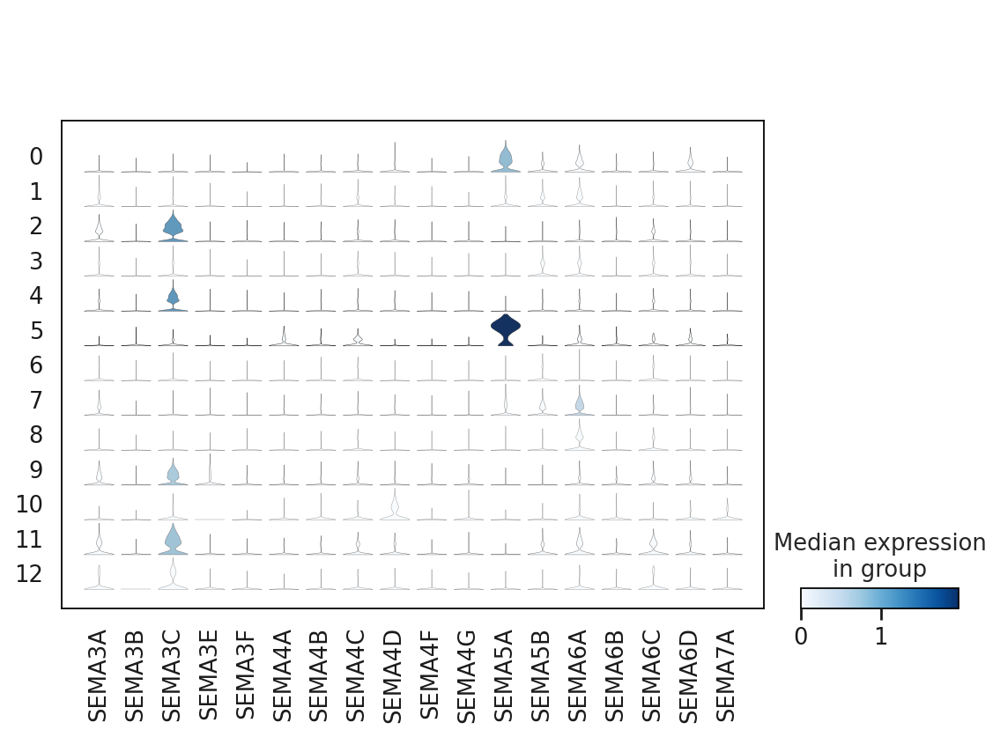

In [28]:
sc.settings.set_figure_params(figsize=[10, 8])
sc.pl.StackedViolin(adata, semaforins, groupby='Leiden_Sel').show()

#### Plot 'TFs' across clusters and original annotation by dotplots anda matrixplot

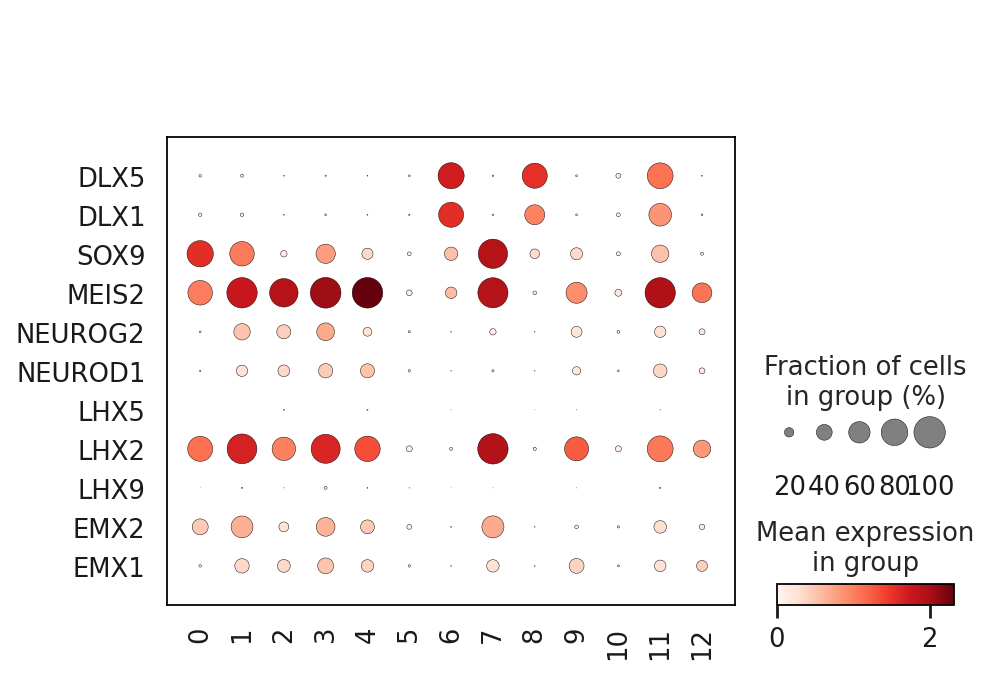

In [29]:
sc.pl.dotplot(adata, TFs, groupby='Leiden_Sel', swap_axes=True)

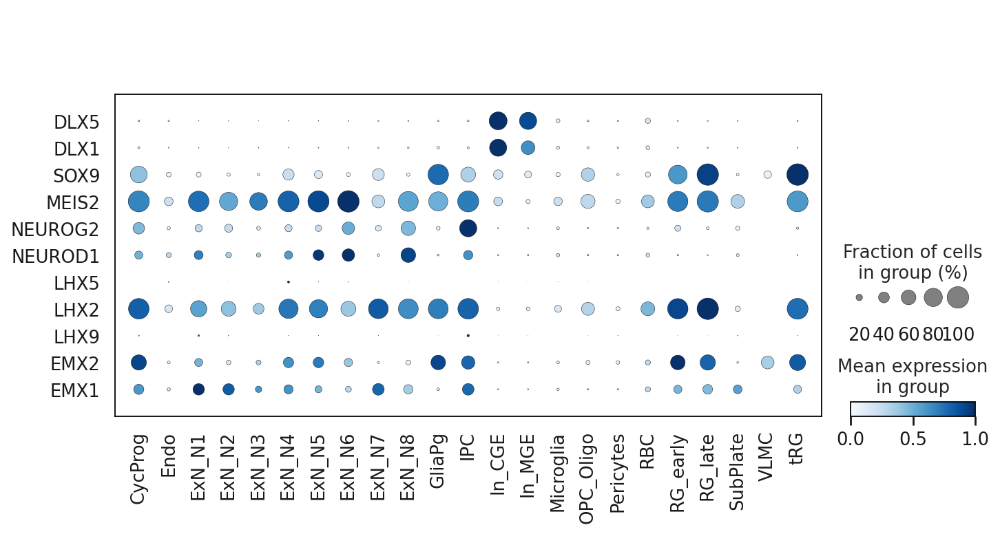

In [30]:
sc.pl.dotplot(adata, TFs, groupby='cell_label', standard_scale="var", cmap='Blues', swap_axes=True)

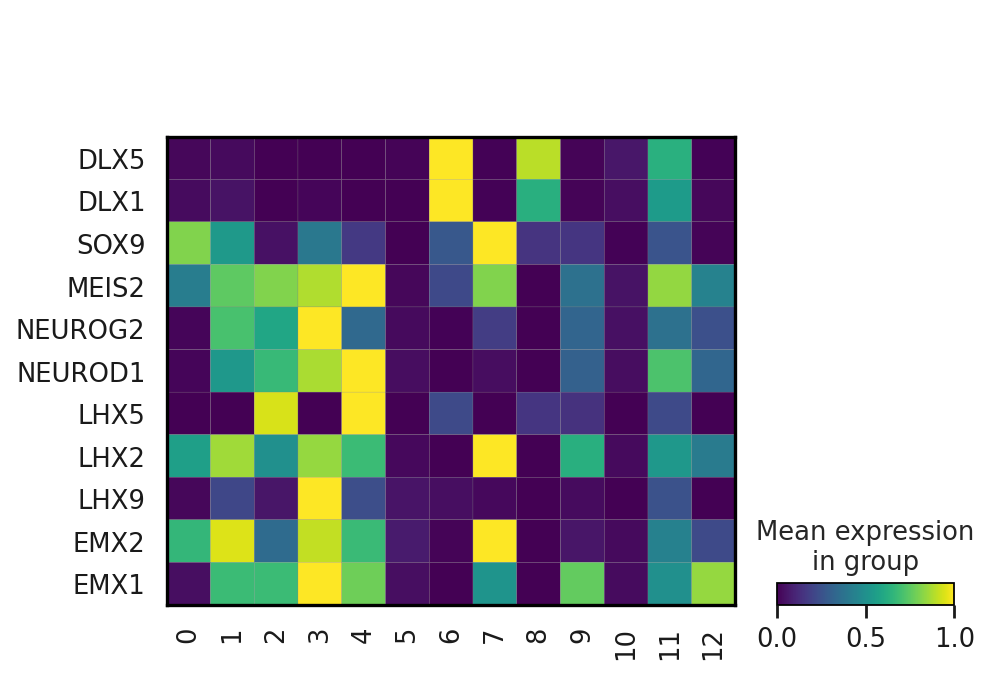

In [31]:
sc.pl.matrixplot(adata, TFs, groupby='Leiden_Sel', swap_axes=True, standard_scale="var")

> `_Try yourself_:` 
> `plot genes involved in steroid synthesis stratified by clusters or cell labels`

In [32]:
# write your code here

## 7.3 Calculate and visualize gene scores

For a gene signature that you expect to be expressed coherently in the same cell population, you can employ the [tl.score.genes](https://scanpy.readthedocs.io/en/stable/generated/scanpy.tl.score_genes.html) to estimate an average expression score, and then plot it on the UMAP.  

In [33]:
sc.tl.score_genes(adata, steroid, score_name='steroid_score')

computing score 'steroid_score'
    finished: added
    'steroid_score', score of gene set (adata.obs).
    549 total control genes are used. (0:00:00)


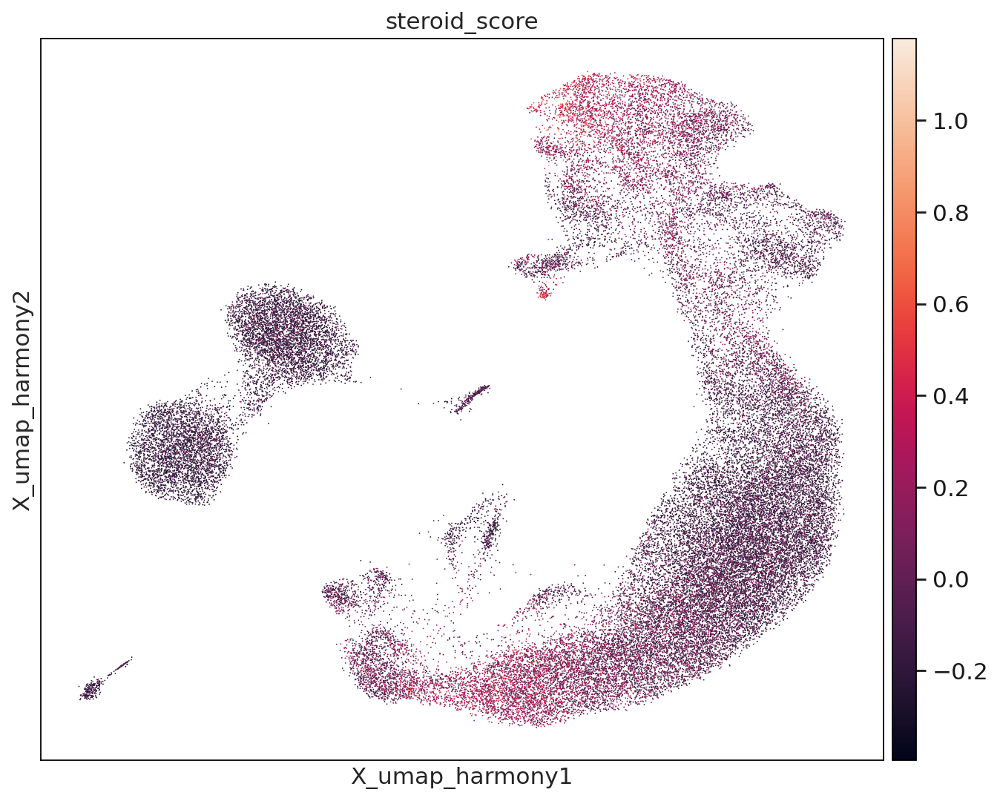

In [34]:
sc.pl.embedding(adata, basis="X_umap_harmony", 
                color='steroid_score')

# 8. Save

## 8.1 Timestamp finished computations 

In [35]:
print(datetime.now())

2024-11-10 10:59:09.538057


## 8.2 Save python and html versions

In [36]:
nb_fname = '2_Clusters'
nb_fname

'2_Clusters'

In [38]:
%%bash -s "$nb_fname"
jupyter nbconvert "$1".ipynb --to="python"
jupyter nbconvert "$1".ipynb --to="html"

[NbConvertApp] Converting notebook 2_Clusters.ipynb to python
[NbConvertApp] Writing 12332 bytes to 2_Clusters.py
[NbConvertApp] Converting notebook 2_Clusters.ipynb to html
[NbConvertApp] WARNING | Alternative text is missing on 24 image(s).
[NbConvertApp] Writing 18594002 bytes to 2_Clusters.html
